# Data Mining 2021 Project - Group AD 

## Authors:
#### David Sotto-Mayor Machado (m20201023), Débora Santos (m20200748), Diana Furtado (m20200590)
#### Group AD - (COLOCAR AQUI NOME DA NOSSA CONSULTORIA) Consulting

### Installing and import packages

Maybe it will be necessary install some 'special' packages to this notebook works. 

Please follow the next cells and check if it's necessary

In [1]:
#Install package pyreadstat to read files in bdat format
!pip install pyreadstat

In [2]:
#Install package pandas profiling to the visualizations
!pip install pandas-profiling

In [3]:
#IMPORT LIBRARIES
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.cluster import KMeans, AgglomerativeClustering, MeanShift, DBSCAN, estimate_bandwidth
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, LabelEncoder, RobustScaler
from itertools import product
from math import ceil
from scipy.cluster.hierarchy import dendrogram
%matplotlib inline
import pyreadstat

from pandas_profiling import ProfileReport
%config InlineBackend.figure_format = 'retina'
from scipy.stats import iqr as IQR
from collections import Counter
from sklearn.base import clone
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score

#import phik
import matplotlib.cm as cm
from sklearn.manifold import TSNE

#outliers detection
from scipy import stats
from sklearn.neighbors import LocalOutlierFactor
from sklearn import svm
from sklearn.ensemble import IsolationForest
from sklearn.tree import DecisionTreeClassifier
from os.path import join
from sklearn.metrics import pairwise_distances
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

# Seeting seaborn style
sns.set()

# Import data

In [4]:
# Read the sas7bdat file
insurance, meta = pyreadstat.read_sas7bdat('a2z_insurance.sas7bdat')
type(insurance)

pandas.core.frame.DataFrame

### Describe, explore and assess data quality

In [5]:
# First look at the dataframe
insurance.head()

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985.0,1982.0,2 - High School,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2.0,1981.0,1995.0,2 - High School,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3.0,1991.0,1970.0,1 - Basic,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4.0,1990.0,1981.0,3 - BSc/MSc,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5.0,1986.0,1973.0,3 - BSc/MSc,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [6]:
# Data types and null values verification
insurance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10296 entries, 0 to 10295
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CustID         10296 non-null  float64
 1   FirstPolYear   10266 non-null  float64
 2   BirthYear      10279 non-null  float64
 3   EducDeg        10296 non-null  object 
 4   MonthSal       10260 non-null  float64
 5   GeoLivArea     10295 non-null  float64
 6   Children       10275 non-null  float64
 7   CustMonVal     10296 non-null  float64
 8   ClaimsRate     10296 non-null  float64
 9   PremMotor      10262 non-null  float64
 10  PremHousehold  10296 non-null  float64
 11  PremHealth     10253 non-null  float64
 12  PremLife       10192 non-null  float64
 13  PremWork       10210 non-null  float64
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


In [7]:
# Summary statistics for all variables
insurance.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CustID,10296,NaN,NaN,NaN,5148.5,2972.34,1,2574.75,5148.5,7722.25,10296
FirstPolYear,10266,NaN,NaN,NaN,1991.06,511.268,1974,1980,1986,1992,53784
BirthYear,10279,NaN,NaN,NaN,1968.01,19.7095,1028,1953,1968,1983,2001
EducDeg,10296,5,3 - BSc/MSc,4799,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10260,NaN,NaN,NaN,2506.67,1157.45,333,1706,2501.5,3290.25,55215
GeoLivArea,10295,NaN,NaN,NaN,2.70986,1.26629,1,1,3,4,4
Children,10275,NaN,NaN,NaN,0.706764,0.455268,0,0,1,1,1
CustMonVal,10296,NaN,NaN,NaN,177.893,1945.81,-165680,-9.44,186.87,399.778,11875.9
ClaimsRate,10296,NaN,NaN,NaN,0.742772,2.91696,0,0.39,0.72,0.98,256.2
PremMotor,10262,NaN,NaN,NaN,300.47,211.915,-4.11,190.59,298.61,408.3,11604.4


In [8]:
# Replace possible empty values with NaN
insurance.replace("", np.nan, inplace=True)

# Function to show missing values and their percentages
def missing_data(df):
    l = []
    for col in df.columns:
        missing = df[col].isnull().sum(axis=0)
        percentage = missing/df.shape[0]
        l.append([col,missing,percentage*100])
        df_missing = pd.DataFrame(l, columns = ['Feature','missing','percentage'])
        df_missing = df_missing.sort_values('missing',axis=0, ascending = False)    
    return df_missing

# Check the percentage of missing values
insurance_missing = missing_data(insurance)
insurance_missing = insurance_missing[insurance_missing['missing']>0]
insurance_missing

,Feature,missing,percentage
12,PremLife,104,1.010101
13,PremWork,86,0.835276
11,PremHealth,43,0.417638
4,MonthSal,36,0.349650
9,PremMotor,34,0.330225
1,FirstPolYear,30,0.291375
6,Children,21,0.203963
2,BirthYear,17,0.165113
3,EducDeg,17,0.165113
5,GeoLivArea,1,0.009713


In [9]:
# Check duplicated observations
insurance.loc[insurance.duplicated(keep=False), :]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork


In [10]:
# Define non-metric features
non_metric_features = ['EducDeg', 'GeoLivArea', 'Children']

# Make a copy of the dataframe
df = insurance.copy()

# Define metric features
metric_features = df.columns.drop(non_metric_features).to_list()

### Visualization/Correlations

In [11]:
#PANDAS PROFILING.
profile = ProfileReport(df, title="Pandas Profiling Report")


In [12]:
profile.to_notebook_iframe()

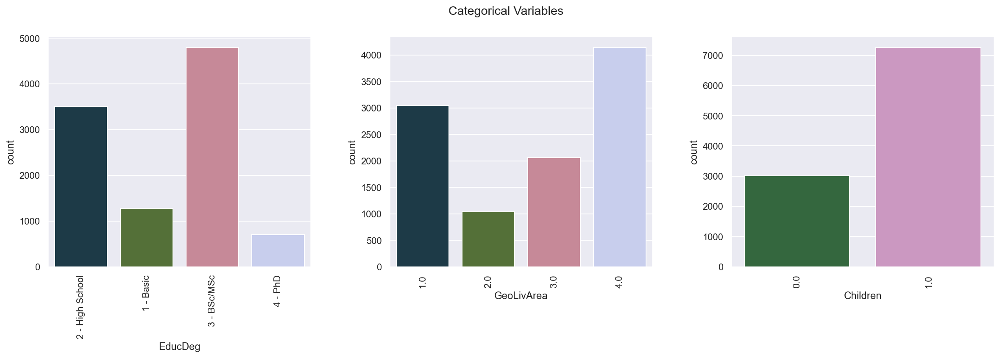

In [13]:
# Absolute frequencies for the non-metric features
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(1, ceil(len(non_metric_features) / 1), figsize=(20, 5))

# Plot data
# Iterate across axes objects and associate each bar plot
for ax, feat in zip(axes.flatten(), non_metric_features):
    g = sns.countplot(df[feat], ax=ax, palette = 'cubehelix')
    g.set_xticklabels(g.get_xticklabels(),rotation=90)

# Layout
# Add a centered title to the figure:
title = "Categorical Variables"
plt.suptitle(title)

#Adjust the space between plots
plt.subplots_adjust(wspace=0.3, hspace=0.3)

#Show plot

plt.show()

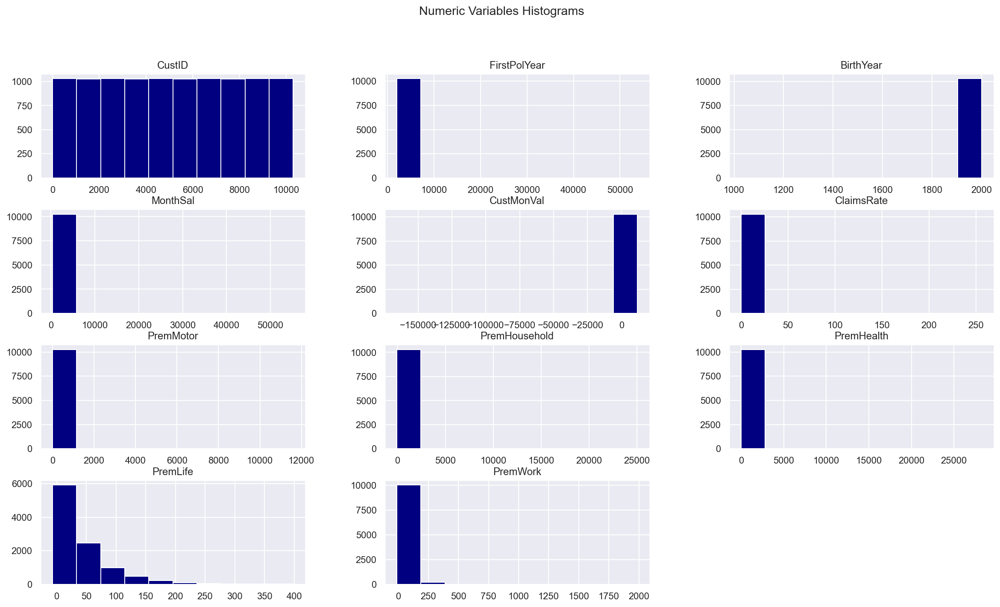

In [14]:
# Histograms for the metric features
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram:
for ax, feat in zip(axes.flatten(), metric_features): 
    ax.hist(df[feat], color = "Navy")
    ax.set_title(feat)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables Histograms"
plt.suptitle(title)

#Adjust the space between plots
plt.subplots_adjust(wspace=0.3, hspace=0.3)

# Remove the last plot
axes.flatten()[-1].remove()

#Show Plot
plt.show()

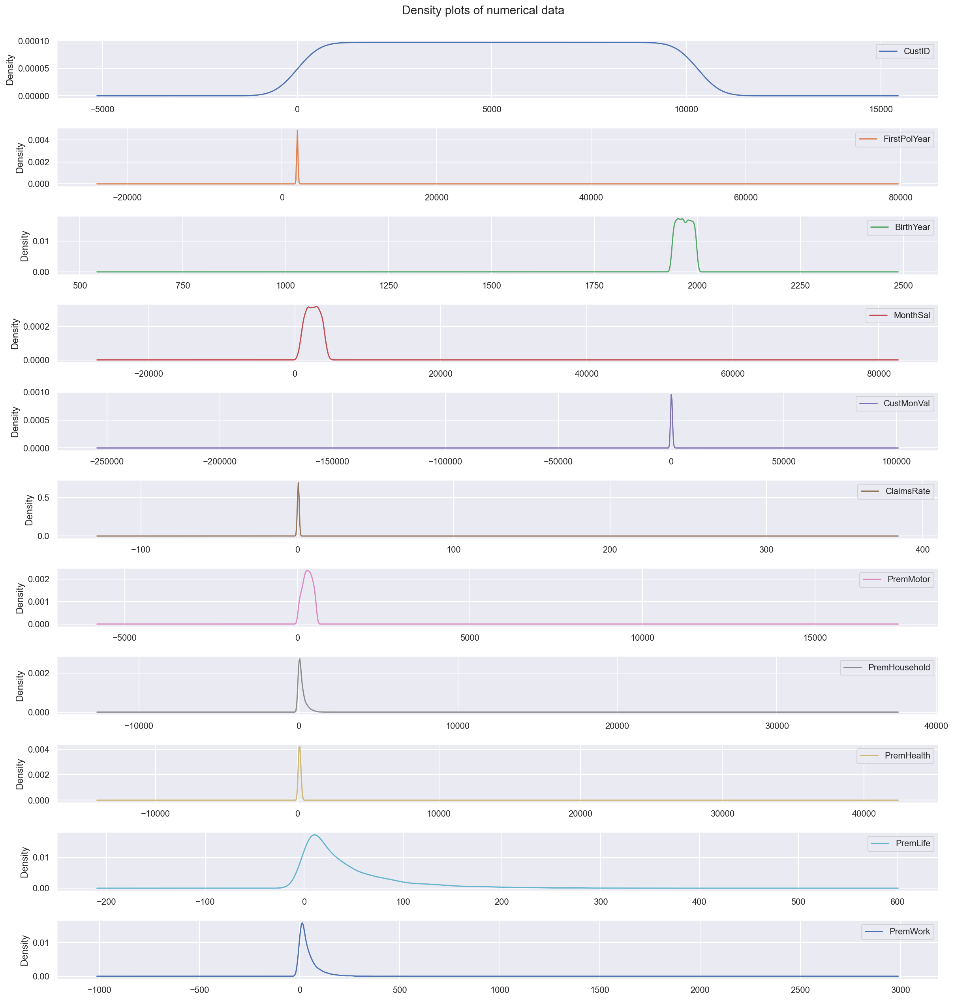

In [15]:
# Density plots for the metric features
sns.set()

# set desity plot and layout
df[metric_features].plot(kind='density', subplots=True, figsize=(20,20),sharex=False)
plt.subplots_adjust(top=0.95)

# Layout
# Add a centered title to the figure:

plt.suptitle("Density plots of numerical data", fontsize=15)

#Adjust the space between plots
plt.subplots_adjust(hspace=0.5)

#Show Plot
plt.show()

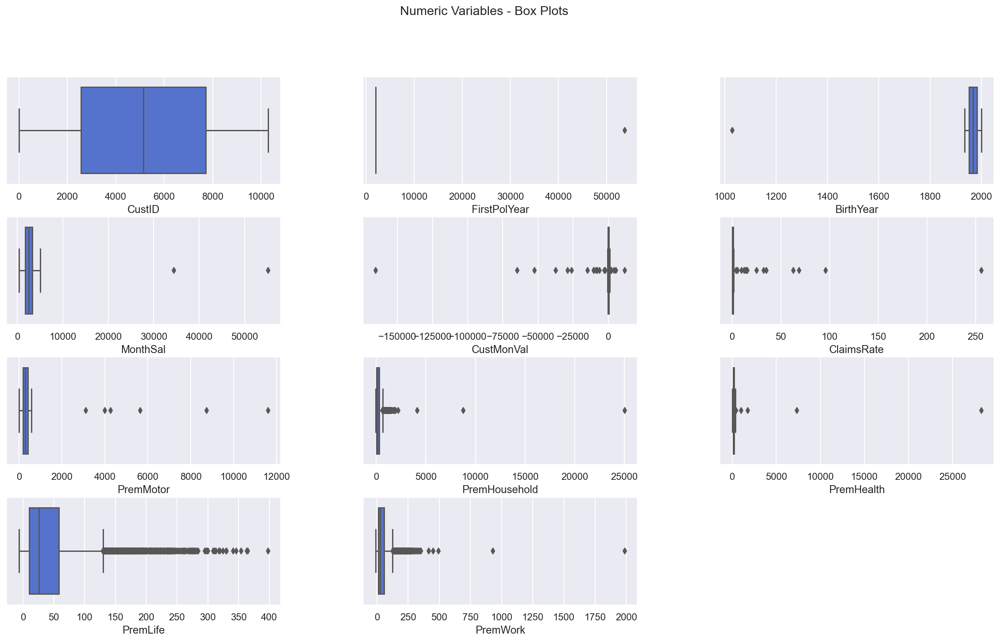

In [16]:
# Boxplots for the metric features
sns.set()

# Prepare figure and create individual axes where each box plot will be placed
fig, axes = plt.subplots(4, ceil(len(metric_features) /4), figsize=(20, 11))

# Plot the data
# Iterate across axes objects and associate each box plot
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(df[feat], ax=ax,color="royalblue")
    
# Layout
# Add a centered title to the figure
title = "Numeric Variables - Box Plots"
plt.suptitle(title)

# Adjust the space between plots
plt.subplots_adjust(wspace=0.3, hspace=0.3)

# Remove the last plot
axes.flatten()[-1].remove()

# Show plots
plt.show()

## Data Preparation:

In [17]:
df=df.set_index('CustID')

In [18]:
# Drop categorical features
#To run the clustering solutions, we need only numerical features.
df.drop({"EducDeg","GeoLivArea","Children"},axis=1,inplace=True)
df

,FirstPolYear,BirthYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,
1.0,1985.0,1982.0,2177.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,1981.0,1995.0,677.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,1991.0,1970.0,2277.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,1990.0,1981.0,1099.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,1986.0,1973.0,1763.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...
10292.0,1984.0,1949.0,3188.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10293.0,1977.0,1952.0,2431.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10294.0,1994.0,1976.0,2918.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89


### Feature Engineering

<li>Client Seniority</li><li>Client Age</li></ul><br/><i>Reference Year: 2016</i>

In [19]:
#Calculate new columns
df['Seniority']=2016-df['FirstPolYear']
df['Age']=2016-df['BirthYear']
#Drop original data
df.drop({"FirstPolYear","BirthYear"},axis=1,inplace=True)
#Sort Columns
cols = df.columns.tolist()
cols = cols[-2:] + cols[:-2]
df=df[cols]

In [20]:
df.head()

,Seniority,Age,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,
1.0,31.0,34.0,2177.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,35.0,21.0,677.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,25.0,46.0,2277.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,26.0,35.0,1099.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,30.0,43.0,1763.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [21]:
# Remove columns with low variance -> feature is approximately constant and will not improve the performance of the model 
# Features with variance lower to 10% will be removed

# Select features with variance higher then 10%
keep_variance_features = df.columns[df.var() > 0.1]

# Features with low variance
low_variance_features = list(set(keep_variance_features) ^set(df.columns))
print("the features variance lower than 10% are:")
print(low_variance_features)

# Check result
df[keep_variance_features]

the features variance lower than 10% are:
[]


,Seniority,Age,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,
1.0,31.0,34.0,2177.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,35.0,21.0,677.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,25.0,46.0,2277.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,26.0,35.0,1099.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,30.0,43.0,1763.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...
10292.0,32.0,67.0,3188.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10293.0,39.0,64.0,2431.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10294.0,22.0,40.0,2918.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89


### Correlation

#### In order to perform clustering is useless and harmful to keep variables that are either highly or lowly correlated with each other. In the first case because it leads to redudancy of the data, the second because lowly correlated columns will have tha same value among all the clusters and give no information to our cluster analysis.

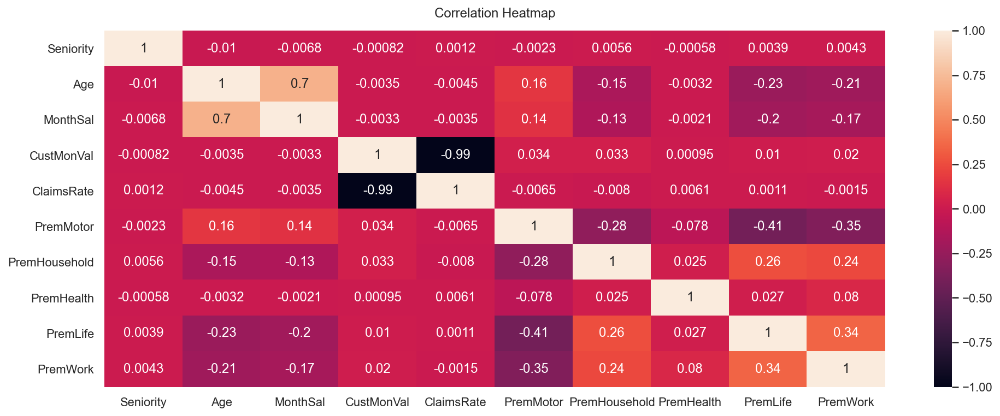

In [22]:
# Pearson correlation heatmap (numeric features)
plt.figure(figsize=(16, 6))
corr = sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True)
corr.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

In [23]:
# Droping the variables with high correlation
df.drop(['ClaimsRate'], axis=1, inplace=True)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10296 entries, 1.0 to 10296.0
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Seniority      10266 non-null  float64
 1   Age            10279 non-null  float64
 2   MonthSal       10260 non-null  float64
 3   CustMonVal     10296 non-null  float64
 4   PremMotor      10262 non-null  float64
 5   PremHousehold  10296 non-null  float64
 6   PremHealth     10253 non-null  float64
 7   PremLife       10192 non-null  float64
 8   PremWork       10210 non-null  float64
dtypes: float64(9)
memory usage: 804.4 KB


In [25]:
#re-define non_metric and metric due to drop columns
metric_features = df.columns

### Dealing with Outliers

#### Fill missing values with median momentarily

In [26]:
df_no_nan = df[metric_features].fillna(df[metric_features].median()).copy()

In [27]:
df_no_nan.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10296 entries, 1.0 to 10296.0
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Seniority      10296 non-null  float64
 1   Age            10296 non-null  float64
 2   MonthSal       10296 non-null  float64
 3   CustMonVal     10296 non-null  float64
 4   PremMotor      10296 non-null  float64
 5   PremHousehold  10296 non-null  float64
 6   PremHealth     10296 non-null  float64
 7   PremLife       10296 non-null  float64
 8   PremWork       10296 non-null  float64
dtypes: float64(9)
memory usage: 804.4 KB


In [28]:
#Standardize the data to run the outliers methods
#Select data
df_out = df_no_nan.copy()
# Create a StandardScaler
scale = StandardScaler()
# Fit and Transform data by applying the scale obtained in the previous command
scale_feat= scale.fit_transform(df_out[metric_features])
#Applying the transformation in the dataset
df_out[metric_features]=scale_feat
#Check the results
df_out.head()

,Seniority,Age,MonthSal,CustMonVal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,
1.0,0.011847,-0.710545,-0.285319,0.104371,0.356343,-0.371495,-0.085147,0.112530,-0.472709
2.0,0.019683,-1.370704,-1.583607,-0.158822,-1.054121,0.583611,-0.185461,3.232531,1.266349
3.0,0.000094,-0.101168,-0.198767,0.167947,-0.445815,0.039903,-0.158785,0.944840,1.127793
4.0,0.002053,-0.659764,-1.218355,-0.100160,-0.557701,-0.473883,0.472072,-0.134371,-0.249578
5.0,0.009888,-0.253513,-0.643647,-0.073321,0.180360,-0.461262,0.037346,-0.484729,0.005902


In [29]:
#Check the statistics summary to check it worked
df_out.describe().apply(lambda s: s.apply(lambda x:format(x,'g')))

,Seniority,Age,MonthSal,CustMonVal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
count,10296,10296,10296,10296,10296,10296,10296,10296,10296
mean,1.3027e-17,-9.03728e-17,1.06105e-17,-1.26739e-16,3.20364e-17,1.10807e-16,4.23046e-17,7.23111e-17,2.29981e-16
std,1.00005,1.00005,1.00005,1.00005,1.00005,1.00005,1.00005,1.00005,1.00005
min,-101.456,-1.67539,-1.88135,-85.2428,-1.4397,-0.809553,-0.587121,-1.03015,-1.0357
25%,-0.00186508,-0.761327,-0.690818,-0.0962795,-0.515808,-0.456582,-0.201622,-0.672813,-0.591778
50%,0.00988816,0.000394572,-0.00445658,0.00461393,-0.00876421,-0.220181,-0.0295301,-0.341285,-0.30161
75%,0.0216414,0.762116,0.677144,0.114038,0.506044,0.225818,0.160303,0.324098,0.289639
max,0.0333946,47.7349,45.6204,6.01218,53.4328,70.4477,95.007,7.54472,37.9528


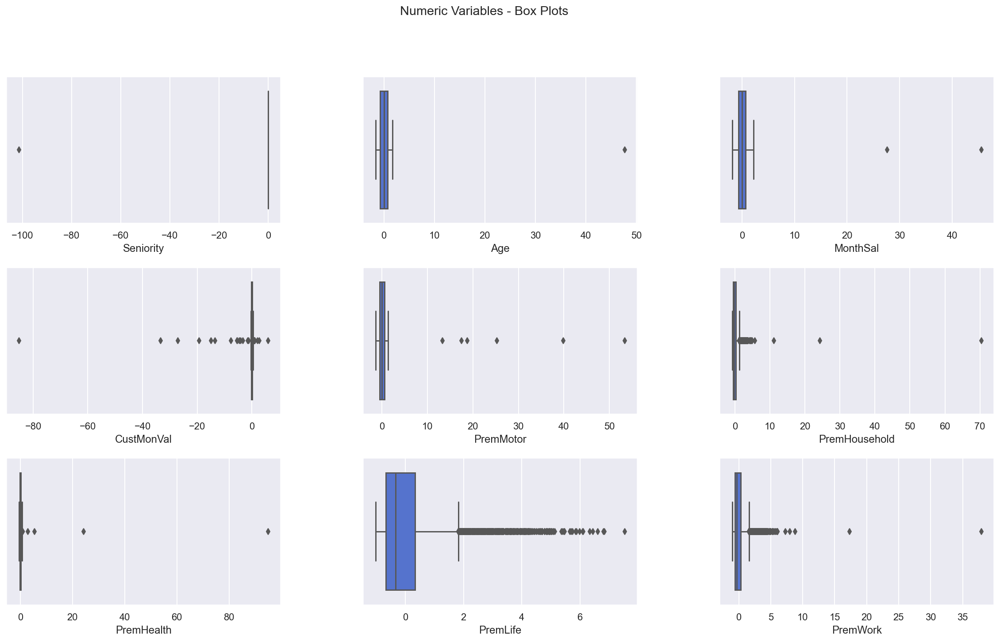

In [30]:
# Boxplots for the metric features
sns.set()

# Prepare figure and create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(metric_features) /3), figsize=(20, 11))

# Plot the data
# Iterate across axes objects and associate each box plot
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(df_out[feat], ax=ax,color="royalblue")
    
# Layout
# Add a centered title to the figure
title = "Numeric Variables - Box Plots"
plt.suptitle(title)

# Adjust the space between plots
plt.subplots_adjust(wspace=0.3, hspace=0.3)


# Show plots
plt.show()

#### 6 methods were used to recognize outliers:

In [31]:
#1) Zscore that checks how many standard deviations is a datapoint distant from the mean;
def out_zscore(df, threshold = 3.0):
    z = pd.DataFrame(np.abs(stats.zscore(df)), columns = df.columns, index = df.index)
    z = pd.DataFrame(z > threshold)
    return z.any(axis = 1).astype(int)

In [32]:
#2) InterQuantile Range method that creates boundaries using the first and third quantile and the interquantile range;
def out_iqr(df, multiplier = 3.0):
    q75 = df.quantile(0.75, axis = 0)
    q25 = df.quantile(0.25, axis = 0)
    iqr = q75 - q25
    lower_bound = q25 - multiplier*iqr
    upper_bound = q75 + multiplier*iqr
    return df.apply(lambda x: np.any((x<lower_bound) | (x>upper_bound)), 1).astype(int)

In [33]:
#3) Local Outlier Factor (LOF) is a function that detects outliers by comparing the density of the neighborhood of a point 
#to the ones of its neighbors.
lof = LocalOutlierFactor(contamination = 'auto',metric = 'euclidean',n_neighbors=1)
lof_out = pd.Series(lof.fit_predict(df_out), index = df_out.index)
lof_out.value_counts(normalize = True)

 1    0.895493
-1    0.104507
dtype: float64

#### 4) At the basis of the Isolation Forest algorithm there is the tendency of anomalous instances in a dataset to be easier to separate from the rest of the sample (isolate), compared to normal points. In order to isolate a data point the algorithm recursively generates partitions on the sample by randomly selecting an attribute and then randomly selecting a split value for the attribute, between the minimum and maximum values allowed for that attribute. When all the trees are grown outliers are identified as points easier to isolate, therefore with a smaller path lenght in the tree, being closer to the root.

In [34]:
isolation_forest = IsolationForest(random_state = 7, contamination=  "auto")
isolation_forest.fit(df_out) #same results with scaled
isofor_outliers = pd.Series(isolation_forest.predict(df_out), index = df_out.index)
isofor_outliers.value_counts(normalize = True)

 1    0.841589
-1    0.158411
dtype: float64

#### 5) One-Class SVM is similar to support vector machine, but instead of using a hyperplane to separate two classes of instances, it uses a hypersphere to encompass all of the instances. The algorithm will try to find the smallest possible hypersphere and point outside of it will be considered outliers. One bad thing of this algorithm is that you have to set in advance the percentage of points that you think are outliers, in this case I use the one retrieved from LOF.

In [35]:
outliers_fraction =   0.063
auto_detection = svm.OneClassSVM(kernel='rbf', gamma=0.01, degree=3, nu=outliers_fraction)
auto_detection.fit(df_out)
svm_outliers = pd.Series(auto_detection.predict(df_out), index = df_out.index)
svm_outliers.value_counts(normalize = True)

 1    0.936966
-1    0.063034
dtype: float64

In [36]:
#Including columns with the results of each method in the dataset to compare the different methods and also combine them.
df_out['zscore'] = out_zscore(df_out)

df_out['iqr'] = out_iqr(df_out, multiplier = 3.0)

df_out['lof_out'] = [0 for i in range(len(df_out))]
df_out.loc[lof_out[lof_out == -1].index, 'lof_out'] = 1

df_out['isofor_out'] = [0 for i in range(len(df_out))]
df_out.loc[isofor_outliers[isofor_outliers == -1].index, 'isofor_out'] = 1

df_out['svm_out'] = [0 for i in range(len(df_out))]
df_out.loc[svm_outliers[svm_outliers == -1].index, 'svm_out'] = 1

df_out['sum_out']  = df_out[['zscore','iqr','svm_out','lof_out','isofor_out']].apply(lambda x: sum(x), axis = 1)

In [37]:
#Create a dataset for see the outliers detect by each model
outliers = df_out[['zscore','iqr','svm_out','lof_out','isofor_out']]
outliers.groupby(['zscore','iqr','svm_out','lof_out','isofor_out'])\
            .size()\
            .to_frame()

0
zscore iqr svm_out lof_out isofor_out      
0      0   0       0       0           7644
                           1            923
                   1       0            818
                           1            143
           1       0       0            149
                           1             77
                   1       0             29
                           1             18
       1   0       0       1             39
                   1       0              1
                           1              5
           1       0       0              1
                           1             26
                   1       1              6
1      1   0       0       0              9
                           1             60
                   1       0              3
                           1              2
           1       0       0              6
                           1            286
                   1       0              5
                           1             46

In [38]:
#Show the number of outliers detect by z-score individually
df_out['zscore'].value_counts()

0    9879
1     417
Name: zscore, dtype: int64

In [39]:
#Show the number of outliers detect by IQR individually
df_out['iqr'].value_counts()

0    9801
1     495
Name: iqr, dtype: int64

In [40]:
#Show the number of outliers detect by combined methods. 
df_out['sum_out'].value_counts()

0    7644
1    1890
4     299
2     299
3     118
5      46
Name: sum_out, dtype: int64

In [41]:
#Chose the number 3 with the best possible solution of combined methods
df1_out = df.loc[df_out.query('sum_out >= 3').index]
df1 = df.drop(index = df_out.query('sum_out >= 3').index)

In [42]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 9833 entries, 1.0 to 10296.0
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Seniority      9803 non-null   float64
 1   Age            9816 non-null   float64
 2   MonthSal       9797 non-null   float64
 3   CustMonVal     9833 non-null   float64
 4   PremMotor      9799 non-null   float64
 5   PremHousehold  9833 non-null   float64
 6   PremHealth     9790 non-null   float64
 7   PremLife       9730 non-null   float64
 8   PremWork       9748 non-null   float64
dtypes: float64(9)
memory usage: 768.2 KB


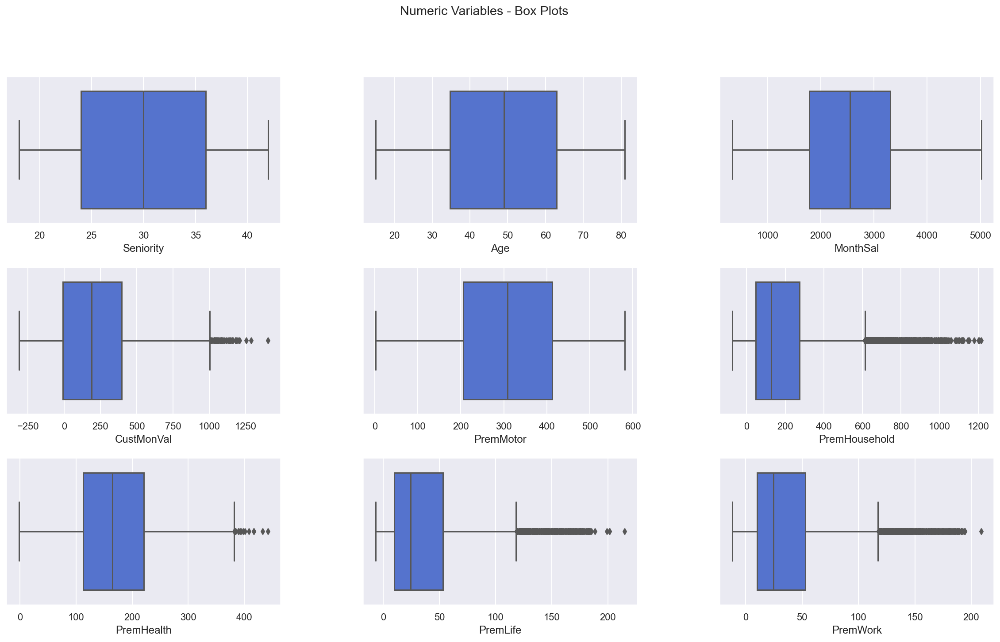

In [43]:
#Check boxplots after outliers removal
# Box plots for the metric features
sns.set()

# Prepare figure and create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(metric_features) /3), figsize=(20, 11))

# Plot the data
# Iterate across axes objects and associate each box plot
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(df1[feat], ax=ax,color="royalblue")
    
# Layout
# Add a centered title to the figure
title = "Numeric Variables - Box Plots"

plt.suptitle(title)

# Adjust the space between plots
plt.subplots_adjust(wspace=0.3, hspace=0.3)

# Show plots
plt.show()

In [44]:
#Chose the number 4 with the best possible solution of combined methods
df2_out = df.loc[df_out.query('sum_out == 4').index]
df2 = df.drop(index = df_out.query('sum_out == 4').index)

In [45]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 9997 entries, 1.0 to 10296.0
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Seniority      9967 non-null   float64
 1   Age            9980 non-null   float64
 2   MonthSal       9961 non-null   float64
 3   CustMonVal     9997 non-null   float64
 4   PremMotor      9963 non-null   float64
 5   PremHousehold  9997 non-null   float64
 6   PremHealth     9954 non-null   float64
 7   PremLife       9894 non-null   float64
 8   PremWork       9911 non-null   float64
dtypes: float64(9)
memory usage: 781.0 KB


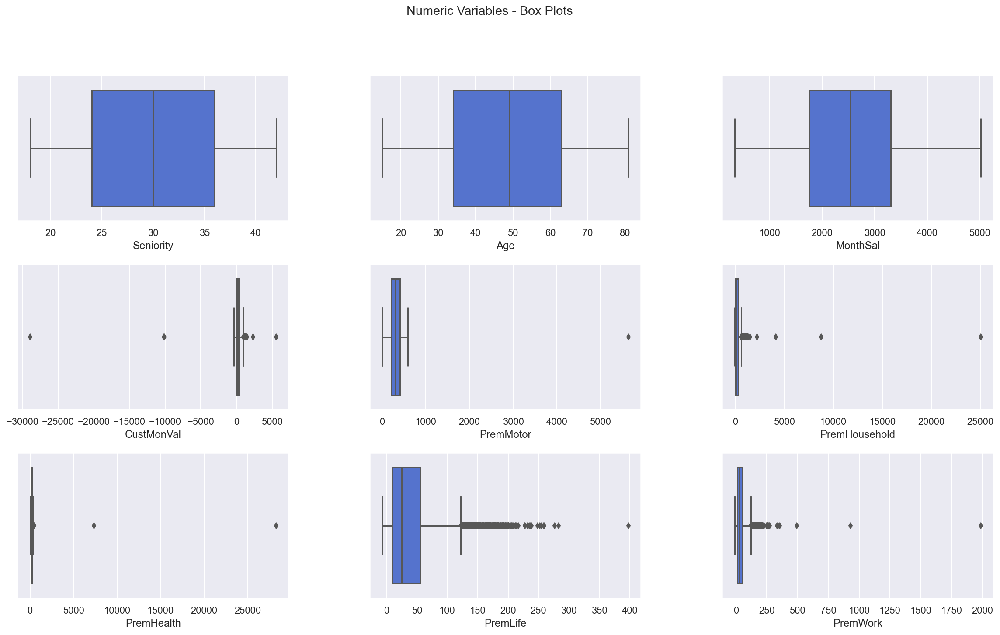

In [46]:
#Check boxplots after outliers removal
# Box plots for the metric features
sns.set()

# Prepare figure and create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(metric_features) /3), figsize=(20, 11))

# Plot the data
# Iterate across axes objects and associate each box plot
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(df2[feat], ax=ax,color="royalblue")
    
# Layout
# Add a centered title to the figure
title = "Numeric Variables - Box Plots"

plt.suptitle(title)

# Adjust the space between plots
plt.subplots_adjust(wspace=0.3, hspace=0.3)

# Show plots
plt.show()

In [47]:
#Chose the number 5 with the best possible solution of combined methods
df3_out = df.loc[df_out.query('sum_out == 5').index]
df3 = df.drop(index = df_out.query('sum_out == 5').index)

In [48]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10250 entries, 1.0 to 10296.0
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Seniority      10220 non-null  float64
 1   Age            10233 non-null  float64
 2   MonthSal       10214 non-null  float64
 3   CustMonVal     10250 non-null  float64
 4   PremMotor      10216 non-null  float64
 5   PremHousehold  10250 non-null  float64
 6   PremHealth     10207 non-null  float64
 7   PremLife       10146 non-null  float64
 8   PremWork       10164 non-null  float64
dtypes: float64(9)
memory usage: 800.8 KB


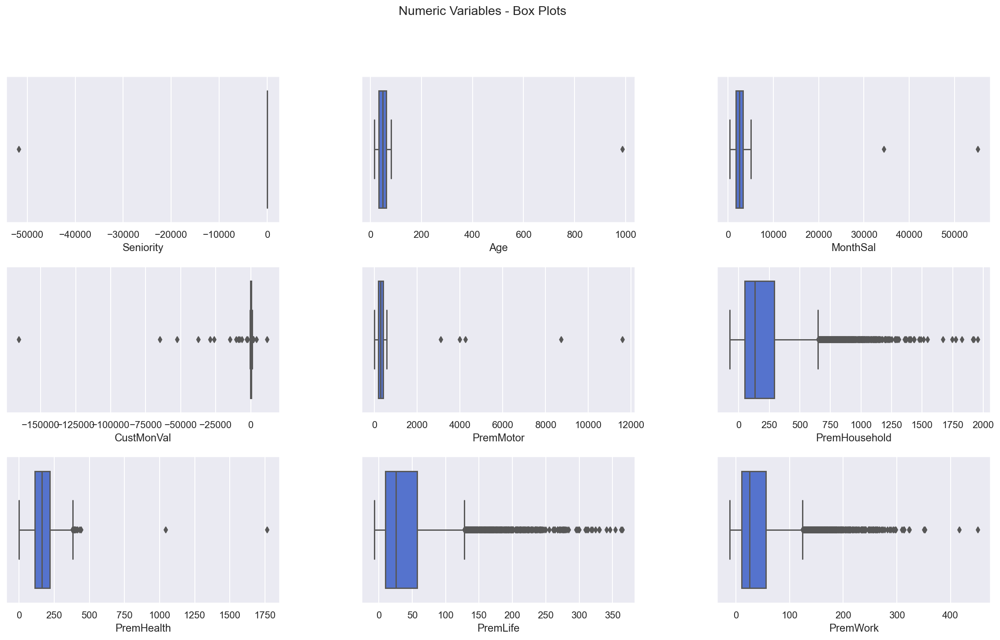

In [49]:
#Check boxplots after outliers removal
# Box plots for the metric features
sns.set()

# Prepare figure and create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(metric_features) /3), figsize=(20, 11))

# Plot the data
# Iterate across axes objects and associate each box plot
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(df3[feat], ax=ax,color="royalblue")
    
# Layout
# Add a centered title to the figure
title = "Numeric Variables - Box Plots"

plt.suptitle(title)

# Adjust the space between plots
plt.subplots_adjust(wspace=0.3, hspace=0.3)

# Show plots
plt.show()

#### After testing removing based on 3 , 4  and 5 combined methods and realising that did not seem to make a big difference on the box plots in terms of outliers, we have dropped this approach and decided to apply Inter quartile range (IQR) on 5 features and later manual filter on other 3 features.

In [50]:
#Create a copy of the dataset
df2_iqr = df.copy()
#Define the features to apply the IQR method
iqr_features= ['PremMotor','PremHealth','Age','Seniority','MonthSal']
#Run the function setting the multiplier =1 and create a new columns to store the results
df2_iqr['out'] = out_iqr(df2_iqr[iqr_features], multiplier = 1)
#Show the results
df2_iqr['out'].value_counts()

0    10080
1      216
Name: out, dtype: int64

In [51]:
#Filter the data excluding the outliers detected
df2_iqr1 = df2_iqr[df2_iqr['out']==0]
#Create a dataset to the outliers detected
df2_iqr_out = df2_iqr[df2_iqr['out']==1]
#Drop the column create in both datasets
df2_iqr1.drop(['out'], axis=1, inplace=True)
df2_iqr_out.drop(['out'], axis=1, inplace=True)

In [52]:
print('Percentage of data kept after removing outliers:', np.round(df2_iqr1.shape[0] / df.shape[0], 4))

Percentage of data kept after removing outliers: 0.979


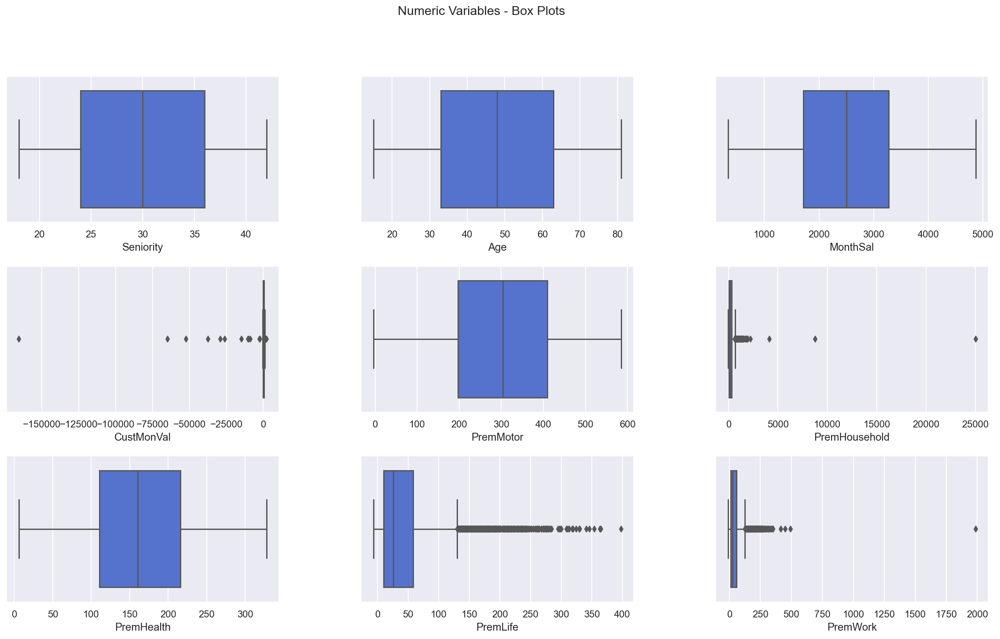

In [53]:
#Check boxplots after outliers removal
# Box plots for the metric features
sns.set()

# Prepare figure and create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(metric_features) /3), figsize=(20, 11))

# Plot the data
# Iterate across axes objects and associate each box plot
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(df2_iqr1[feat], ax=ax,color="royalblue")
    
# Layout
# Add a centered title to the figure
title = "Numeric Variables - Box Plots"

plt.suptitle(title)

# Adjust the space between plots
plt.subplots_adjust(wspace=0.3, hspace=0.3)

# Show plots
plt.show()

In [62]:
#hand made outliers
filters1 = (

    
    (df2_iqr1['CustMonVal']>=-1000)
    &
    (df2_iqr1['PremWork']<=400)
    &
    (df2_iqr1['PremHousehold']<=2000) 
    &
    (df2_iqr1['PremLife']<=390)
)
   
df2_outfilter = df2_iqr1[filters1]
print('Percentage of data kept after removing outliers:', np.round(df2_outfilter.shape[0] / df.shape[0], 4))

Percentage of data kept after removing outliers: 0.96


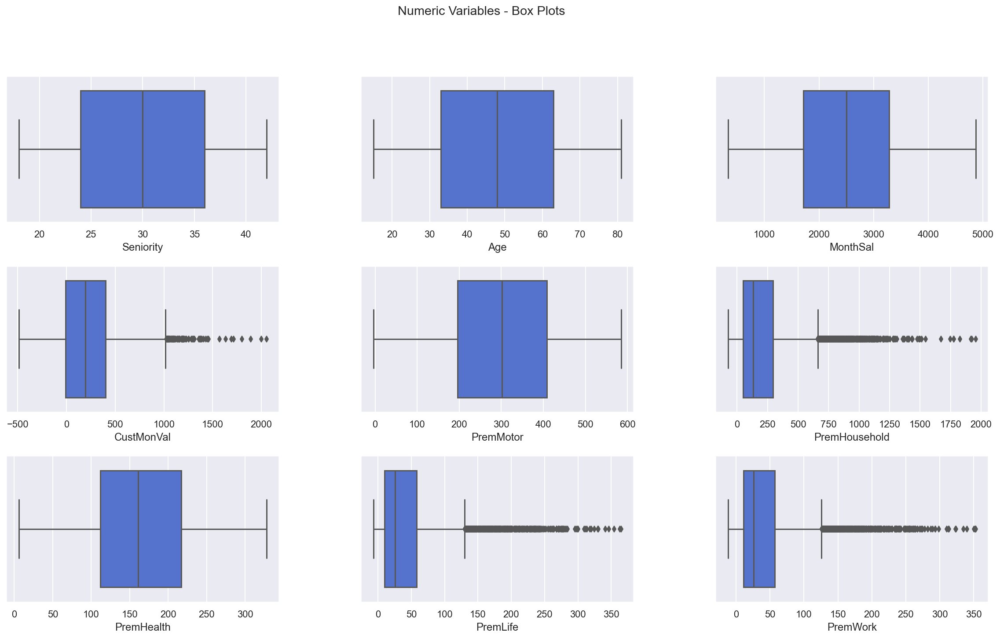

In [63]:
#Check boxplots after outliers removal
# Box plots for the metric features
sns.set()

# Prepare figure and create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(metric_features) /3), figsize=(20, 11))

# Plot the data
# Iterate across axes objects and associate each box plot
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(df2_outfilter[feat], ax=ax,color="royalblue")
    
# Layout
# Add a centered title to the figure
title = "Numeric Variables - Box Plots"

plt.suptitle(title)

# Adjust the space between plots
plt.subplots_adjust(wspace=0.3, hspace=0.3)

# Show plots
plt.show()

In [64]:
df2 = df2_outfilter.copy()

In [65]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 9884 entries, 1.0 to 10296.0
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Seniority      9855 non-null   float64
 1   Age            9867 non-null   float64
 2   MonthSal       9850 non-null   float64
 3   CustMonVal     9884 non-null   float64
 4   PremMotor      9864 non-null   float64
 5   PremHousehold  9884 non-null   float64
 6   PremHealth     9856 non-null   float64
 7   PremLife       9884 non-null   float64
 8   PremWork       9884 non-null   float64
dtypes: float64(9)
memory usage: 772.2 KB


### Missing data

In [68]:
#Remover todos com 15 anos que tem seguro de trabalho

In [ ]:
#substituir por missing values todos os contratos que o seniority é maior que age. 

In [66]:
#RUN KNN IMPUTER TO REPLACE MISSING VALUES
scaler = StandardScaler()
scaled = scaler.fit_transform(df2[metric_features])
imputer = KNNImputer(weights='distance', n_neighbors=100)
imputer.fit(scaled)
imputed_metric = imputer.transform(scaled)
df2.loc[:,metric_features] = scaler.inverse_transform(imputed_metric)

In [67]:
#Check Missing data
df2.isna().sum().sum()

0